##In diesem Notebook soll die Explorative Datenanalyse in der Challenge - Climate Change dargestellt werden

## Inhaltsverzeichnis:
- Wetterdaten im netCDF Format
    - netCDF analysieren
    - Wetterdaten aus netCDF ploten
- Climate Change Story
- Städtespezifische Analyse von Temperatur und Niederschlag
    - Datenbereitstellung
    - Monatliche Durchschnittstemperatur
    - Zeitliche Entwicklung der Temperatur
    - Monatliche Niederschlag
    - Zeitliche Entwicklung des Niederschlags

In [21]:
import pandas as pd
import numpy as np
import numpy.ma as ma
import matplotlib.pyplot as plt
import time
import netCDF4
import requests
import io
import os
from bs4 import BeautifulSoup
from mpl_toolkits.basemap import Basemap

# Wetterdaten im netCDF Format
## netCDF Analysieren
Die Wetterdaten sind als netCDF Dateien von meteo Suisse bezogen worden. Da es sich hierbei um kubische Daten handelt, muss untersucht werden wie auf diese Daten zuegriffen werden kann. Dazu wurde die Library netCDF4 installiert, welche eine API zu netCDF Daten herstellen kann und zudem sauber dokumentiert installiert

In [16]:
# Angabe des Pfades
path = "netCDF_data/RhiresM_ch01r.swisscors_198001010000_198012010000.nc"

# Lesen der Daten
cube_data = netCDF4.Dataset(path, mode='r')

In [17]:
# Info anzeigen der Daten
cube_data

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF3_CLASSIC data model, file format NETCDF3):
    Conventions: CF-1.6
    institution: Federal Office of Meteorology and Climatology MeteoSwiss
    References: 
    dimensions(sizes): dummy(1), chx(370), chy(240), time(12)
    variables(dimensions): float64 dummy(dummy), float64 swiss_coordinates(dummy), float64 chx(chx), float64 chy(chy), float64 time(time), float32 RhiresM(time,chy,chx), float32 lon(chy,chx), float32 lat(chy,chx)
    groups: 

Es wurde ein Cube für eine Jahr geladen und dabei ist folgendes zu sehen:
- Die X Koordinaten besitzen 370 Werte, es handelt sich dabei um Schweizer Koordinaten 
- -->(https://www.schoolmaps.ch/2017/12/20/neue-koordinaten-fuer-die-schweiz-www-swisstopo-chlv95/)
- Die Y Koordinaten besitzen 240 Werte, es handelt sich dabei um Schweizer Koordinaten
- Die Zeitachse hat 12 verschiedene Layer, dies entspricht den 12 verschiedenen Monaten
- Der Niederschlag hängt von den Variabeln Zeit, X und Y Schweizer Koordinate ab
- Die GPS Koordinate ist abhängig von Schweizer X und Y Koordinate 

Um die Wetterdaten vernüftig darstellen zu können, werden die GPS Koordinaten verwendet. Das Schweizer Koordinatensystem ist im vergleich zum GPS Koordinatensystem verschieden, da aber für die Darstellung der Wetterdaten die GPS Koordinaten gebraucht werden, werden diese auch so extrahiert. Es wird zu sehen sein, dass die Koordinaten jeweils aus Arrays bestehen, da diese Mühsam aus den Schweizer Koordinaten berechnet werden müssen

In [18]:
lons = cube_data.variables['lon'][:]
lats = cube_data.variables['lat'][:]

In [19]:
lons, lats

(masked_array(
   data=[[ 5.8268523,  5.839691 ,  5.8525305, ..., 10.538955 , 10.551778 ,
          10.564601 ],
         [ 5.8265886,  5.83943  ,  5.852271 , ..., 10.539462 , 10.552287 ,
          10.565113 ],
         [ 5.826325 ,  5.839168 ,  5.8520117, ..., 10.539969 , 10.552797 ,
          10.565624 ],
         ...,
         [ 5.761826 ,  5.775183 ,  5.788541 , ..., 10.664084 , 10.677426 ,
          10.690767 ],
         [ 5.761541 ,  5.7749004,  5.78826  , ..., 10.664634 , 10.677978 ,
          10.691321 ],
         [ 5.7612553,  5.774617 ,  5.787979 , ..., 10.665182 , 10.678529 ,
          10.6918745]],
   mask=False,
   fill_value=1e+20,
   dtype=float32),
 masked_array(
   data=[[45.720608, 45.720795, 45.720974, ..., 45.68928 , 45.688923,
          45.68857 ],
         [45.729603, 45.729786, 45.72997 , ..., 45.69827 , 45.69791 ,
          45.697556],
         [45.738594, 45.738777, 45.73896 , ..., 45.707256, 45.706898,
          45.706543],
         ...,
         [47.85193 , 4

## Wetterdaten aus netCDF Daten plotten
Um die Wetterdaten darstellen zu können wird auf die Library von Basemap zurückgegriffen

### ACHTUNG: Um die Library von Basemap zum Laufen zu bringen bedarf es einiges Anpassungen am System (Dependencies), da es sich um eine alte Library handelt. 

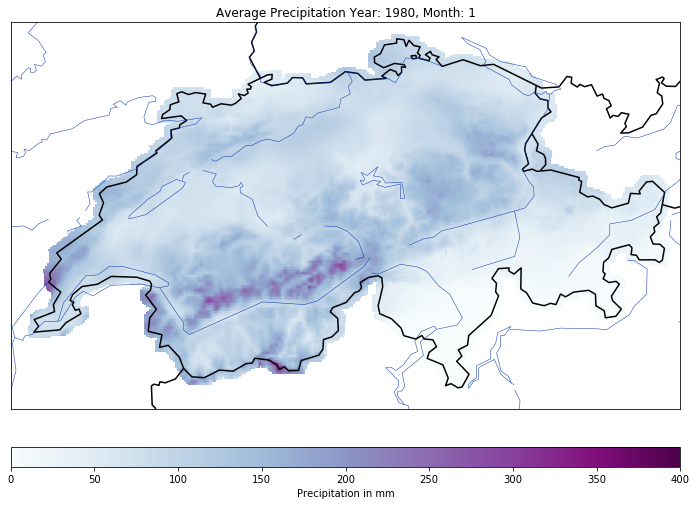

In [20]:
# Create the underlying map with Basemap
m = Basemap(
    projection='mill',
    llcrnrlat=45.7,
    urcrnrlat=47.9,
    llcrnrlon=5.8,
    urcrnrlon=10.6,
    resolution='i') 

'''
projection: style of map (https://matplotlib.org/basemap/users/mapsetup.html)
llcrnlat: lower left corner of map latitude coordinate
urcrnlat: upper right corner of map latitude coordinate
llcrnrlon: lower left corner of map longitude coordinate
urcrnrlon: upper right corner of map longtitude coordinate
Resolution: c (crude), l (low), i (intermediate), h (high), f (full)
'''

# Transforming 2 dimensional data into one dimensional data
xi, yi = m(lons, lats)

# Set the size of the output figure
plt.figure(figsize=(12,9))

# Add Coastlines, Country Boundaries, Rivers and Lakes
m.drawcoastlines(linewidth=0.5, color='#0A37B0')
m.drawcountries(linewidth=1.5, color='#000000')
m.drawrivers(linewidth=0.5, color='#0A37B0')

# Extract Data
niederschlag = cube_data.variables['RhiresM'][1,:,:]

# Plot Data
cs = m.pcolor(xi,yi,np.squeeze(niederschlag),vmin=0, vmax = 400, cmap='BuPu')

# As Referenzen for min and max figures we are referencing to Meteo Suisse and their graphics
# (https://www.meteoschweiz.admin.ch/home/klima/schweizer-klima-im-detail/monats-und-jahresgitterkarten.html)

# Adding a colorbar on the bottom of the graphic
cbar = m.colorbar(cs, location='bottom', pad='10%')
cbar.set_label('Precipitation in mm')

# Adding a title to the graphic
plt.title('Average Precipitation Year: 1980, Month: 1')

#Savinf the plot to ".png" 
plt.savefig('Niederschlag_1980_1.png')

# Climate Change Datenstory
Dieses Notebook erhält den Code welche für die Erstellung der Plots der Klima Story verwendet wurden. Bevor die Bearbeitung der Daten in Python stattgefunden hat, wurden die Daten anhand von Stichproben direkt analisiert. Hierbei wurde erstmals recherchiert, welche Daten bezüglich Weinanbau in der Schweiz erhoben werden und wo eine mögliche Korreklation zu den vorhandene Klimadaten besteht. Dabei konnten wir feststellen, dass aufgrund der Datengrundlagen und für viele der Daten kein direkter Bezug zu den verwendeten Klimadaten gemacht werden kann. Zudem haben unsere Recherchen gezeigt, dass viele Faktoren des Weinanbau, eine Vielzahl an Einflussfaktoren haben, welche wir mit unserer Datengrundlage nicht nachweisen konnten. Eine klarer Zusammenhang wurde dann aber bei den Brix-Werten und Temperaturen festgestellt. Diese Daten wurden dann auch zusammengetragen, bereinigt und für die Story und dementsprechend die Plots verwendet.

In [22]:
'''
Import der weinspezifischen Daten. Die Daten wurden vorgängig aus verschiedenen Berichten des Bundesamts für Landwirtschaft extrahiert und aufbereitet. 
Die Rohdaten sind unter in folgender Website zu finden: https://www.blw.admin.ch/blw/de/home/nachhaltige-produktion/pflanzliche-produktion/weine-und-spirituosen/weinwirtschaftliche-statistik.html

Die Daten vor 1994 wurde in der Masseinheit Oechsle Grad erfasst, ab 1994 wurden Brix Grad verwendet. Für die Zusammenführung der Daten wurden die Ochsle Grad Werte durch 4.25 dividiert. (Anhang Infos von: http://wein-kunde.de/Seiten/ueber_wein/seiten/mostgewicht.html)
'''
data = pd.read_csv('Brix_Pinot.csv', header=1)

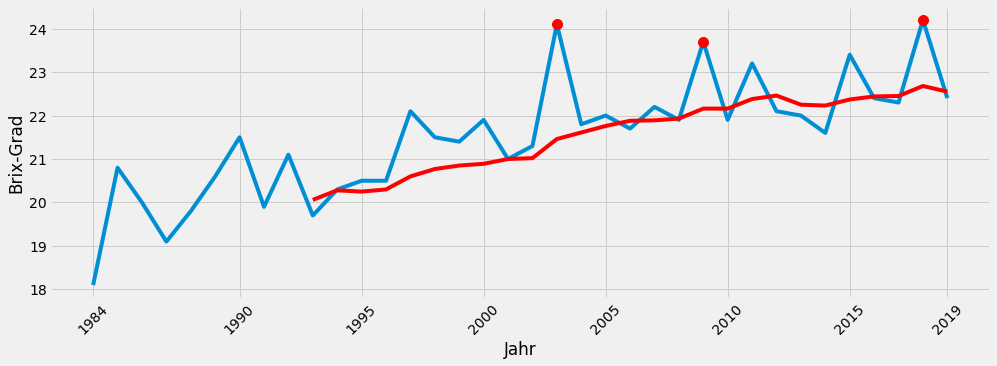

In [23]:
# Definiton des Stils für alle folgenden Plots
plt.style.use('fivethirtyeight') # plt.style.available - anzeigen aller verfügbaren Styles


# Dieser Plot zeigt die den Durschnittlichen Brix-Grad der Pinot Noir Weine, sowie ein rolling Average über 5 Jahre. Zudem sind die markantesten drei Jahre markiert. Für die Story wurde dieser Plot schlussendlich nicht verwendet.
fig = data.plot(x='Year', y=(['Durchschnitt']), kind = 'line',figsize=(15,5),legend=False)
fig.set_ylabel('Brix-Grad')
fig.set_xlabel('Jahr')
plt.xticks([1984,1990,1995,2000,2005,2010,2015,2019]) 
fig.tick_params(axis ='x', rotation = 45)
plt.plot(2003, 24.1 ,marker='.',color='red',ms=20)
plt.plot(2009, 23.7 ,marker='.',color='red',ms=20)
plt.plot(2018, 24.2 ,marker='.',color='red',ms=20)
rolling_mean = data['Durchschnitt'].rolling(window=10).mean()
plt.plot(data['Year'], rolling_mean, label='Rolling Mean 10 Years', color='red')
plt.show()

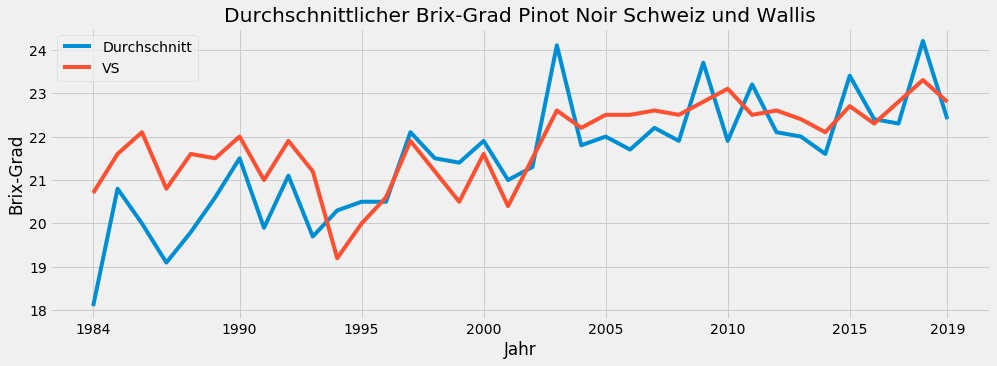

In [24]:
# Brix-Grade von Pinot Noir Trauben im Wallis im Vergleich zur restlichen Schweiz
fig = data.plot(x='Year', y=(['Durchschnitt','VS']), kind = 'line',figsize=(15,5),legend=True)

fig.set_ylabel('Brix-Grad')
fig.set_title('Durchschnittlicher Brix-Grad Pinot Noir Schweiz und Wallis')
fig.set_xlabel('Jahr')
plt.xticks([1984,1990,1995,2000,2005,2010,2015,2019]) 
fig.tick_params(axis ='x')

plt.show()

In [25]:
data.mean()

Year            2001.500000
Durchschnitt      21.500000
ZH                20.961111
SH                21.430556
SG                21.713889
GR                22.672222
TG                20.858333
VS                21.822222
VD                21.566667
NE                20.997222
GE                 9.763889
dtype: float64

In [26]:
# Import der gesamtschweizerischen Temperaturdaten erhoben von MeteoSchweiz. Diese Daten stehen öffentlich auf der Website zur Verfugung. 

response = requests.get('https://www.meteoschweiz.admin.ch/product/input/climate-data/swissmean/10.18751-Climate-Timeseries-CHTM-1.1-swiss.txt')

file_object = io.StringIO(response.content.decode('utf-8'))
temp = pd.read_csv(file_object, sep='\t', skiprows=15)

print(temp.head)

<bound method NDFrame.head of      time   jan   feb   mar   apr    may    jun    jul    aug    sep   oct  \
0    1864 -7.10 -4.52  0.04  2.11   7.43   9.48  12.37  10.95   8.59  3.50   
1    1865 -3.47 -6.25 -5.91  7.03  10.09  10.98  13.99  11.16  11.90  5.19   
2    1866 -1.31 -0.42 -1.00  4.11   4.95  12.02  12.25   9.98   9.70  5.34   
3    1867 -3.87  0.56 -0.13  3.49   7.74  10.57  11.29  12.93  10.43  2.92   
4    1868 -5.46 -1.53 -2.30  2.33  12.04  11.97  12.89  12.50  11.12  4.76   
..    ...   ...   ...   ...   ...    ...    ...    ...    ...    ...   ...   
152  2016 -1.10 -0.19  0.14  4.57   7.88  11.97  15.09  14.80  12.54  5.38   
153  2017 -5.15  0.46  4.11  4.42   9.80  15.18  15.05  15.45   8.65  7.78   
154  2018  0.48 -5.21 -0.21  7.81  10.43  13.81  16.24  15.89  12.56  8.04   
155  2019 -4.37  0.73  2.27  4.47   6.08  15.25  16.21  15.10  11.37  8.45   
156  2020 -0.28  1.62  1.53  7.62    NaN    NaN    NaN    NaN    NaN   NaN   

      nov   dec   djf   mam    jj

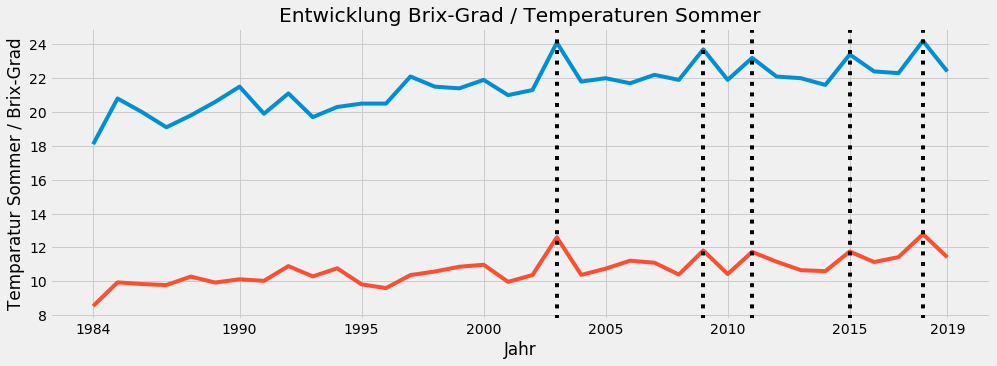

In [27]:
# Vergleich der Brix-Grade und Temperaturentwicklungen in der Schweiz

fig = data.plot(x='Year', y=(['Durchschnitt']), kind = 'line',figsize=(15,5),legend=False)
fig.set_ylabel('Temparatur Sommer / Brix-Grad')
fig.set_xlabel('Jahr')
plt.xticks([1984,1990,1995,2000,2005,2010,2015,2019]) 
fig.tick_params(axis ='x') #rotation = 45
fig.set_title('Entwicklung Brix-Grad / Temperaturen Sommer')
plt.plot(temp.loc[120:155,'time'],temp.loc[120:155,'summer'])
# Print lines
plt.axvline(x=2003,color='black',linestyle='dotted')
plt.axvline(x=2009,color='black',linestyle='dotted')
plt.axvline(x=2011,color='black',linestyle='dotted')
plt.axvline(x=2015,color='black',linestyle='dotted')
plt.axvline(x=2018,color='black',linestyle='dotted')

plt.show()

In [32]:
# Einelsen der Wetterdaten der Station Sion (Datenquelle MeteoSchweiz: https://www.meteoschweiz.admin.ch/home/klima/schweizer-klima-im-detail/homogene-messreihen-ab-1864.html?region=Tabelle)
sio = pd.read_csv('homog_mo_SIO.txt', skiprows=27, delim_whitespace=True)

In [33]:
# Jahresdurschnitt Niederschlag
siog = sio.groupby('Year')['Precipitation'].mean().reset_index()

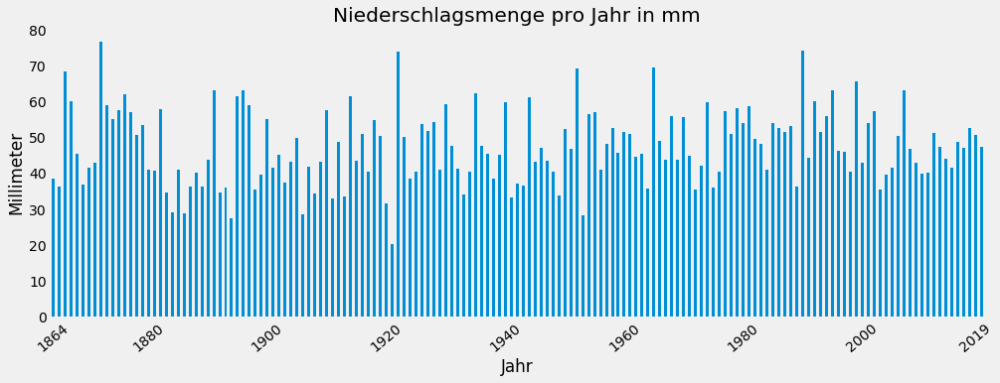

In [34]:
# Darstellung der durschnittlichen Niederschlagsmenge pro Jahr
fig = siog.plot(x=('Year'), y=(['Precipitation']), kind = 'bar',figsize=(15,5),legend=False)
fig.set_ylabel('Millimeter')
fig.set_title('Niederschlagsmenge pro Jahr in mm')
fig.set_xlabel('Jahr')
plt.xticks([0,16,36,56,76,96,116,136,155],[temp.loc[0,'time'],temp.loc[16,'time'],temp.loc[36,'time'],temp.loc[56,'time'],temp.loc[76,'time'],temp.loc[96,'time'],temp.loc[116,'time'],temp.loc[136,'time'],temp.loc[155,'time']]) 
fig.grid(False)
fig.tick_params(axis ='x', rotation = 40)

plt.show()

In [35]:
# Berechnung der Durschnittstemparatur der Normperiode 1961-2019. Die Normperiode wurde durch MeteoSchweiz so definiert, diese wurde übernommen.
mean = float(temp.loc[97:126,['year']].mean())
# Abweichung zur Norm berechnen
temp['avg'] = temp['year']-mean

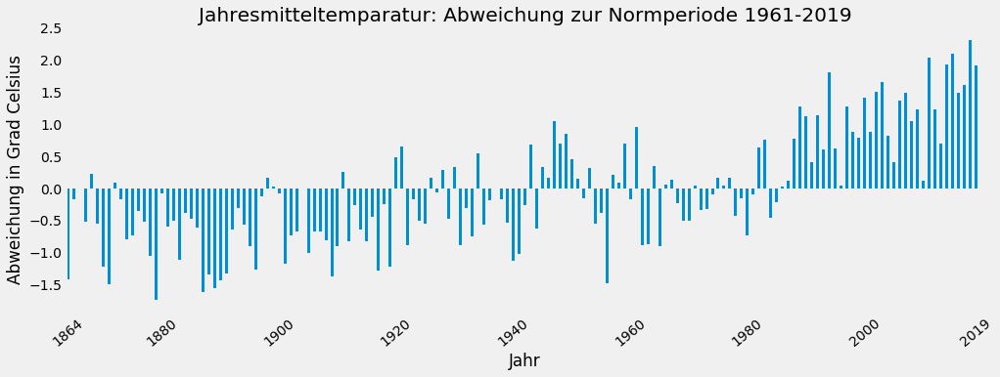

In [36]:
# Darstellung der Temperaturabwechungen zur definierten Normperiode
fig = temp.plot(x=('time'), y=(['avg']), kind = 'bar',figsize=(15,5),legend=False)
fig.set_ylabel('Abweichung in Grad Celsius')
fig.set_title('Jahresmitteltemparatur: Abweichung zur Normperiode 1961-2019')
fig.set_xlabel('Jahr')
fig.grid(False)
plt.xticks([0,16,36,56,76,96,116,136,155],[temp.loc[0,'time'],temp.loc[16,'time'],temp.loc[36,'time'],temp.loc[56,'time'],temp.loc[76,'time'],temp.loc[96,'time'],temp.loc[116,'time'],temp.loc[136,'time'],temp.loc[155,'time']]) 
fig.tick_params(axis ='x', rotation = 40)

plt.show()

# Städtespezifische Analyse von Temperatur und Niederschlag
Der Output dieser Grafiken hängt von der gesamten Datenbankinfrstruktur der Challenge ab. Diese kann für dieses Notebook nicht hinzugefügt werden. Der grafische Output kann auf folgender Webseite nachgeschaut werden:

## http://45.32.156.57:8050/

Der Output der Auswertungen für die jeweilige Stadt hängt vom Input des Nutzers ab. Die GPS Daten werden über die beiden Datenbanken auf dem System abgeglichen um damit dann die Daten aus den netCDF Cubes zu laden und dann aufzuzeigen

In [ ]:
# Get Location of request by user
def get_location():

    #Get the current IP adress of the user
    page = requests.get("https://iplocation.com/")
    soup = BeautifulSoup(page.content, 'html.parser')

    #ip_adress = soup.find("b").get_text()
    lattitude = soup.find("td", {"class": "lat"}).get_text()
    longitude = soup.find("td", {"class": "lng"}).get_text()
    return(float(longitude), float(lattitude))

## Datenbereitstellung
Die Daten werden im File "get_city_weather.py" basierend auf dem Input der User zusammengetragen um diese im spätern Verlauf für die Grafikerstellung bereitzustellen

In [ ]:
def get_temp (lon_location, lat_location):

    def find_temperatur(year,min_index_lon,min_index_lat):

        #open file
        path = os.path.join(os.path.expanduser('~'), 'climate_change', 'TabsM_1961_2017_ch01r.swisscors', 'TabsM_ch01r.swisscors_{Y}01010000_{Y}12010000.nc').format(Y=year)
        meteoswiss_data = Dataset(path)

        #creating a List and adding the Value of the same messurment point to it
        
        timeseries = []
        temperatur = meteoswiss_data.variables['TabsM']

        for month in range(0,12):
            timeseries.append(temperatur[month][min_index_lat][min_index_lon])
        #close netcdf
        meteoswiss_data.close()
        
        return(timeseries)

    path = os.path.join(os.path.expanduser('~'), 'climate_change', 'TabsM_1961_2017_ch01r.swisscors', 'TabsM_ch01r.swisscors_{Y}01010000_{Y}12010000.nc').format(Y=1961)
    meteoswiss_data = Dataset(path)

    # read latitutde and longitude variable
    lat = meteoswiss_data.variables['lat'][:] 
    lon = meteoswiss_data.variables['lon'][:]

    #calculate the min distance of a measurement station
    sq_distance = ((lat_location-lat)**2)+((lon_location-lon)**2)

    #find the index of the array with the smallest distance
    index = ma.where(sq_distance == sq_distance.min())
    min_index_lat = index[0][0]
    min_index_lon = index[1][0]

    #close netcdf
    meteoswiss_data.close()

    # create a List to put the Temperature values in.
    temperatur_year = []

    for year in range(1961, 2020):
        temperatur_year = temperatur_year + find_temperatur(year, min_index_lon, min_index_lat)

    # creating a panda with the temperature for the city
    data_range = pd.date_range(start='1961', end='2020', freq='M')
    timeseries_temp = pd.DataFrame(temperatur_year, columns=['temperatur'], index=data_range)
    return (timeseries_temp)


#Funktion um den Niederschlag in einer Koordinate zu erhalten
def get_precipitation (lon_location, lat_location):


    def find_precipitation(year,min_index_lon,min_index_lat):

        #open file
        path = os.path.join(os.path.expanduser('~'), 'climate_change', 'RhiresM_1961_2019_ch01r.swisscors', 'RhiresM_ch01r.swisscors_{Y}01010000_{Y}12010000.nc').format(Y=year)

        meteoswiss_data = Dataset(path)

        #creating a List and adding the Value of the same messurment point to it
        
        timeseries = []

        precipitation = meteoswiss_data.variables['RhiresM']

        for month in range(0,12):
            timeseries.append(precipitation[month][min_index_lon][min_index_lat])
        #close netcdf
        meteoswiss_data.close()
        return(timeseries)

    path = os.path.join(os.path.expanduser('~'), 'climate_change', 'TabsM_1961_2017_ch01r.swisscors', 'TabsM_ch01r.swisscors_{Y}01010000_{Y}12010000.nc').format(Y=1961)

    meteoswiss_data = Dataset(path)

    # read latitutde and longitude variable
    lat = meteoswiss_data.variables['lat'][:] 
    lon = meteoswiss_data.variables['lon'][:]

    #calculate the min distance of a measurement station
    sq_distance = ((lat_location-lat)**2)+((lon_location-lon)**2)
    min_sq_distance = sq_distance.min()

    #find the index of the array with the smallest distance
    index = ma.where(sq_distance == sq_distance.min())
    min_index_lat = index[0][0]
    min_index_lon = index[1][0]

    #extract the precipitation for all years and saving them to a list
    precipitation_year = []
    for year in range(1961,2020):
        precipitation_year = precipitation_year + find_precipitation(year,min_index_lat,min_index_lon)

    data_range = pd.date_range(start = '1961', end= '2020', freq='M')

    #creating a panda with the precipitation for the city
    Niederschlag = pd.DataFrame(precipitation_year, columns=['Niederschlag'], index=data_range)
    return(Niederschlag)

## Monatliche Durchschnittstemperatur

In [ ]:
def create_graph(city):
    if city:
        # Choose the coordinate, look if a city already has been entered
        # Change the name of the city into coordinates (the data to do this is stored in the database)
        Sql_query = """SELECT Longitude, Latitude FROM coordinates WHERE Ortschaftsname = %s;"""
        # Evoke Connection
        con = database_connection.connect()
        get_coordinates = pd.read_sql(Sql_query, con=con, params=(city,))
        latitude = get_coordinates['Latitude']
        latitude = np.asarray(latitude[0])
        longitude = get_coordinates['Longitude']
        longitude = np.asarray(longitude[0])

        df = get_city_weather.get_temp(longitude, latitude)

        fig = go.Figure()
        fig.add_trace(
            go.Scatter(x=df.index, y=df['temperatur'].round(2), mode='markers', name="Alle Messwerte", opacity=0.6))
        fig.add_trace(
            go.Scatter(x=df.index, y=df.rolling(12).mean()['temperatur'].round(2), mode='lines',
                       name="Jahresdurchschnitt",
                       hoverinfo='skip'))

        # Define Text for Hover
        fig.update_traces(hovertemplate='Jahr: %{x} <br>Temperatur: %{y}\u00B0C')

        # plotly figure layout
        fig.update_layout(template='seaborn',
                          title={
                              'text': "Monatliche Durchschnittstemperatur",
                              'xanchor': 'right'},
                          xaxis_title='Zeit in Monaten', yaxis_title='Temperatur in \u00B0C', legend=dict(x=0, y=-0.3))

        # Close DB connection
        con.close()

    else:
        fig = go.Figure()

    return fig

## Zeitliche Entwicklung der Temperatur

In [ ]:
def create_graph(city):
    if city:
        # Choose the coordinate, look if a city already has been entered
        # Change the name of the city into coordinates (the data to do this is stored in the database)
        Sql_query = """SELECT Longitude, Latitude FROM coordinates WHERE Ortschaftsname = %s;"""
        # Evoke Connection
        con = database_connection.connect()
        get_coordinates = pd.read_sql(Sql_query, con=con, params=(city,))
        latitude = get_coordinates['Latitude']
        latitude = np.asarray(latitude[0])
        longitude = get_coordinates['Longitude']
        longitude = np.asarray(longitude[0])

        df = get_city_weather.get_temp(longitude, latitude)
        df['temperatur'] = df['temperatur'] - float(df.mean())

        # Group by value per year
        df = df.groupby(df.index.map(lambda x: x.year)).mean()

        # start graph
        fig = go.Figure()

        pos_value = df[(df >= 0).all(axis=1)]
        neg_value = df[(df < 0).all(axis=1)]

        fig.add_trace(go.Bar(x=pos_value.index, y=round(pos_value['temperatur'], 2),
                             marker_color='crimson',
                             name=''
                             ))
        fig.add_trace(go.Bar(x=neg_value.index, y=round(neg_value['temperatur'], 2),
                             marker_color='blue',
                             name=''
                             ))
        fig.update_traces(hovertemplate='Jahr: %{x} <br>Temperaturabweichung: %{y}\u00B0C')

        # plotly figure layout
        fig.update_layout(template='plotly_white', showlegend=False,
                          title="Zeitliche Entwicklung von der Temperatur <br>(Abweichung vom Durchschnitt 1961-2020)",
                          xaxis_title='Jahre', yaxis_title='Abweichung in \u00B0C')

        # Close DB connection
        con.close()

    else:
        fig = go.Figure()

    return fig

## Monatlicher Niederschlag

In [ ]:
def create_graph(city):
    if city:
        # Choose the coordinate, look if a city already has been entered
        # Change the name of the city into coordinates (the data to do this is stored in the database)
        Sql_query = """SELECT Longitude, Latitude FROM coordinates WHERE Ortschaftsname = %s;"""
        # Evoke Connection
        con = database_connection.connect()
        get_coordinates = pd.read_sql(Sql_query, con=con, params=(city,))
        latitude = get_coordinates['Latitude']
        latitude = np.asarray(latitude[0])
        longitude = get_coordinates['Longitude']
        longitude = np.asarray(longitude[0])

        df = get_city_weather.get_precipitation(longitude, latitude)

        fig = go.Figure()
        fig.add_trace(
            go.Scatter(x=df.index, y=df['Niederschlag'].round(2), mode='markers', name="Alle Messwerte", opacity=0.6))
        fig.add_trace(go.Scatter(x=df.index, y=df.rolling(12).mean()['Niederschlag'].round(2), mode='lines',
                                 name="Jahresdurchschnitt"))


        # Adjust Hover Text
        fig.update_traces(hovertemplate='Jahr: %{x} <br>Niederschlag: %{y}mm')

        # plotly figure layout
        fig.update_layout(template='seaborn',
                          title={
                              'text': "Monatlicher Niederschlag",
                              'xanchor': 'right'},
                          xaxis_title='Zeit in Monaten', yaxis_title='Niederschlag in mm', legend=dict(x=0, y=-0.3))

        # Close DB connection
        con.close()

    else:
        fig = go.Figure()

    return fig

## Zeitliche Entwicklung des Niederschlags

In [ ]:
def create_graph(city):
    if city:
        # Choose the coordinate, look if a city already has been entered
        # Change the name of the city into coordinates (the data to do this is stored in the database)
        Sql_query = """SELECT Longitude, Latitude FROM coordinates WHERE Ortschaftsname = %s;"""
        # Evoke Connection
        con = database_connection.connect()
        get_coordinates = pd.read_sql(Sql_query, con=con, params=(city,))
        latitude = get_coordinates['Latitude']
        latitude = np.asarray(latitude[0])
        longitude = get_coordinates['Longitude']
        longitude = np.asarray(longitude[0])

        df = get_city_weather.get_precipitation(longitude, latitude)

        df['Niederschlag'] = df['Niederschlag'] - float(df.mean())

        # Group by value per year
        df = df.groupby(df.index.map(lambda x: x.year)).sum()

        # start graph
        fig = go.Figure()

        pos_value = df[(df >= 0).all(axis=1)]
        neg_value = df[(df < 0).all(axis=1)]

        fig.add_trace(go.Bar(x=pos_value.index, y=round(pos_value['Niederschlag'], 2),
                             marker_color='crimson',
                             name=''
                             ))
        fig.add_trace(go.Bar(x=neg_value.index, y=round(neg_value['Niederschlag'], 2),
                             marker_color='blue',
                             name=''
                             ))
        fig.update_traces(hovertemplate='Jahr: %{x} <br>Abweichung: %{y}mm')

        # plotly figure layout
        fig.update_layout(template='plotly_white', showlegend=False,
                          title="Zeitliche Entwicklung vom Niederschlag <br>(Abweichung vom Durchschnitt 1961-2020)",
                          xaxis_title='Jahre', yaxis_title='Abweichung in mm')

        # Close DB connection
        con.close()

    else:
        fig = go.Figure()

    return fig